In [29]:
import os
import numpy as np
import pandas as pd
from tqdm import tqdm
from wordcloud import WordCloud, STOPWORDS
from string import digits
from collections import Counter
import matplotlib.pyplot as plt

wordcloud_path = "./mixehr_wordclouds"
medical_stopwords = ['NEC', 'NOS', "MCCNANA", "APR", "EXCEPT"]
medical_stopwords += [word.lower() for word in medical_stopwords]
print(medical_stopwords)
STOPWORDS.update(medical_stopwords)

['NEC', 'NOS', 'MCCNANA', 'APR', 'EXCEPT', 'nec', 'nos', 'mccnana', 'apr', 'except']


In [2]:
phi_with_freqs_pheNames = pd.read_csv('/Users/andrew/Documents/meng/mixEHR/data/precomputed_results/mixmimic/mimic_trainData_JCVB0_nmar_K75_iter5497_phi_normalized_FREQS_WITH_PHENAMES.csv')
phi_with_freqs_pheNames

,typeId,pheId,pheName,1,2,3,4,5,6,7,...,66,67,68,69,70,71,72,73,74,75
0,1,1,aa,792.422923,2138.220971,5086.307577,814.991024,435.664017,265.109726,160.642865,...,89.790827,9248.615048,1405.880872,1997.018539,10532.086291,106.594245,4403.292542,5701.776051,101.120539,107.801812
1,1,2,aaa,8.120430,8.624936,9.692866,7.782734,9.204396,7.902261,8.803089,...,9.938769,8.546544,10.123598,6.985597,7.391888,9.135545,7.566964,7.988761,8.403537,7.343397
2,1,3,aaarepair,7.068879,6.487190,5.692096,5.376850,5.498093,5.290240,6.241604,...,8.737287,7.143156,5.619793,5.079977,6.191192,5.655448,5.431685,5.521326,5.310966,5.266755
3,1,4,aaataa,3.448546,3.087018,3.150192,2.987816,3.005255,2.998357,3.004924,...,3.001957,3.029195,3.035262,2.898650,3.181720,3.080091,3.004196,3.024990,2.998297,2.993719
4,1,5,aado,37.607327,30.652147,64.025040,72.017195,176.337752,68.339789,35.036736,...,549.529445,210.672681,28.782568,24.899239,46.978572,43.931210,28.854533,38.005966,256.116888,38.222546
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
52863,6,3082,MS_988_NON-EXTENSIVE O.R. PROC UNRELATED TO PR...,2920.822530,1902.823932,3552.088200,2329.636605,3450.842399,2940.350426,8185.698942,...,2718.001373,1754.788976,1615.898803,1994.451459,1762.372794,1558.228223,4253.477177,1551.477730,3305.082504,1558.149422
52864,6,3083,MS_989_NON-EXTENSIVE O.R. PROC UNRELATED TO PR...,1541.191148,832.206044,1510.202747,1010.592761,1459.648670,961.510927,892.183594,...,1182.945672,737.274428,510.618555,901.719943,730.831198,656.667383,1776.810818,646.575552,1411.000734,652.633981
52865,6,3084,MS_98_NON-BACTERIAL INFECT OF NERVOUS SYS EXC ...,1317.156223,881.079163,1532.813230,1032.864910,1483.241832,971.861720,925.954827,...,1200.814296,738.948870,1953.779203,893.178214,746.472766,671.942024,1737.439644,661.071181,1451.700644,875.052863
52866,6,3085,MS_99_NON-BACTERIAL INFECT OF NERVOUS SYS EXC ...,614.156115,428.518292,757.733813,515.879047,723.387743,481.776546,447.315836,...,596.610659,369.005738,261.001588,453.281106,369.019524,333.926364,848.261448,330.123491,716.152408,367.352190


In [8]:
print(pheNames)

['aa', 'aaa', 'aaarepair', 'aaataa', 'aado', 'aadoreq', 'aag', 'aagradi', 'aai', 'aalt', 'aam', 'aand', 'aaneuro', 'aao', 'aaorient', 'aaox', 'aaoxheent', 'aarom', 'aat', 'aax', 'ab', 'abacavir', 'abandon', 'abat', 'abber', 'abbrevi', 'abc', 'abcess', 'abdaorta', 'abdb', 'abdback', 'abdcarotid', 'abdchest', 'abdct', 'abdgi', 'abdimpress', 'abdm', 'abdnl', 'abdobes', 'abdom', 'abdoman', 'abdomenchest', 'abdomendemonstr', 'abdomenext', 'abdomenextrem', 'abdomenimpress', 'abdomenpelvi', 'abdomenpelvisimpress', 'abdomenrev', 'abdomenshow', 'abdomensoft', 'abdoment', 'abdomi', 'abdominalaort', 'abdominalaorta', 'abdominalback', 'abdominalblo', 'abdominalcolectomi', 'abdominalcompart', 'abdominalct', 'abdominaldiscomfort', 'abdominaldistens', 'abdominaldistent', 'abdominalexam', 'abdominalexamin', 'abdominalhysterectomi', 'abdominalincis', 'abdominalincision', 'abdominalpain', 'abdominalpelv', 'abdominalsurgeri', 'abdominaltend', 'abdominalultrasound', 'abdominalwal', 'abdominalwound', 'abdo

In [14]:
pheNames = phi_with_freqs_pheNames['pheName'].values.tolist()
pheNames = [pheName.lstrip(digits) for pheName in pheNames]
pheNames = [pheName.replace("_", "") for pheName in pheNames]
print(pheNames)

['aa', 'aaa', 'aaarepair', 'aaataa', 'aado', 'aadoreq', 'aag', 'aagradi', 'aai', 'aalt', 'aam', 'aand', 'aaneuro', 'aao', 'aaorient', 'aaox', 'aaoxheent', 'aarom', 'aat', 'aax', 'ab', 'abacavir', 'abandon', 'abat', 'abber', 'abbrevi', 'abc', 'abcess', 'abdaorta', 'abdb', 'abdback', 'abdcarotid', 'abdchest', 'abdct', 'abdgi', 'abdimpress', 'abdm', 'abdnl', 'abdobes', 'abdom', 'abdoman', 'abdomenchest', 'abdomendemonstr', 'abdomenext', 'abdomenextrem', 'abdomenimpress', 'abdomenpelvi', 'abdomenpelvisimpress', 'abdomenrev', 'abdomenshow', 'abdomensoft', 'abdoment', 'abdomi', 'abdominalaort', 'abdominalaorta', 'abdominalback', 'abdominalblo', 'abdominalcolectomi', 'abdominalcompart', 'abdominalct', 'abdominaldiscomfort', 'abdominaldistens', 'abdominaldistent', 'abdominalexam', 'abdominalexamin', 'abdominalhysterectomi', 'abdominalincis', 'abdominalincision', 'abdominalpain', 'abdominalpelv', 'abdominalsurgeri', 'abdominaltend', 'abdominalultrasound', 'abdominalwal', 'abdominalwound', 'abdo

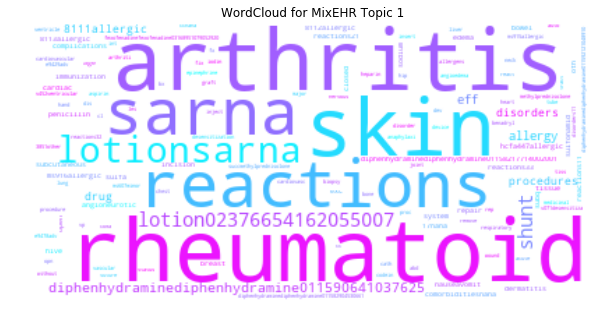

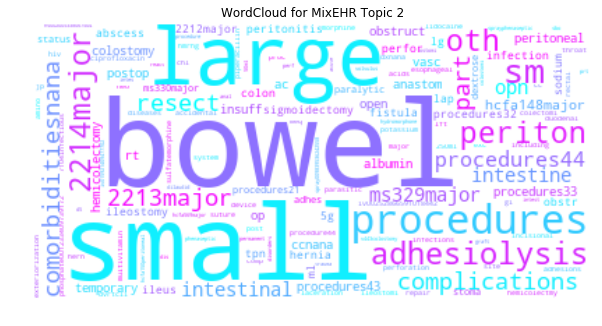

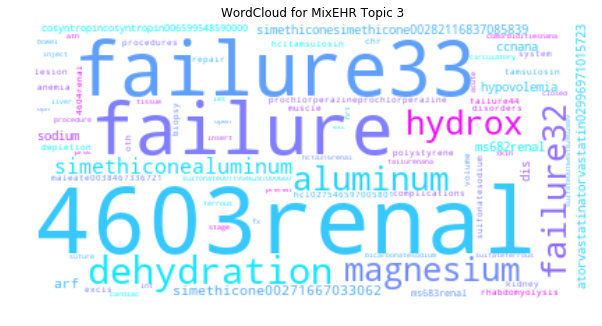

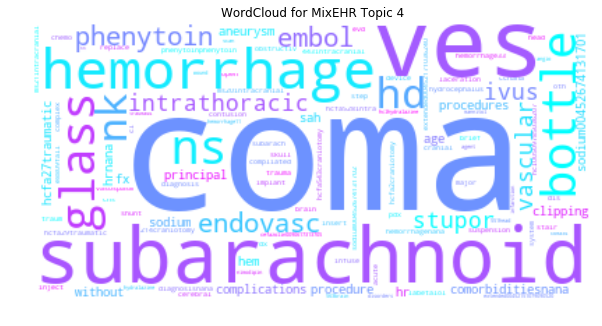

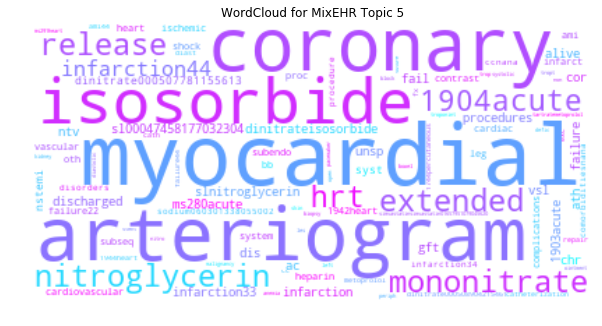

...

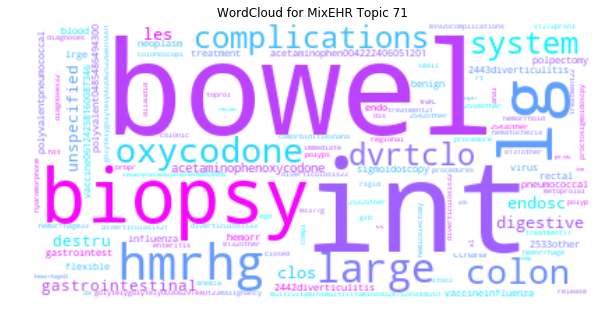

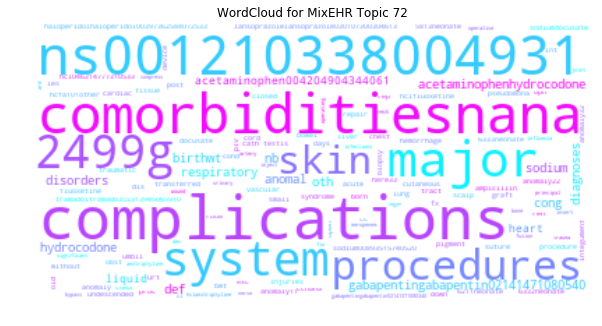

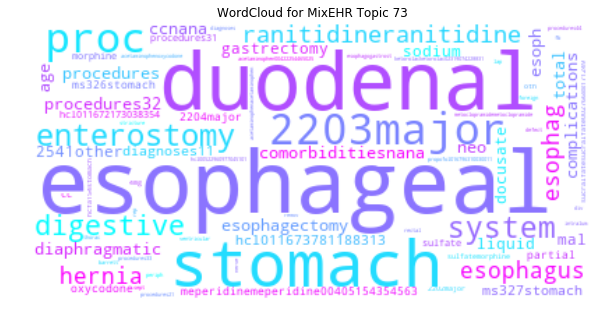

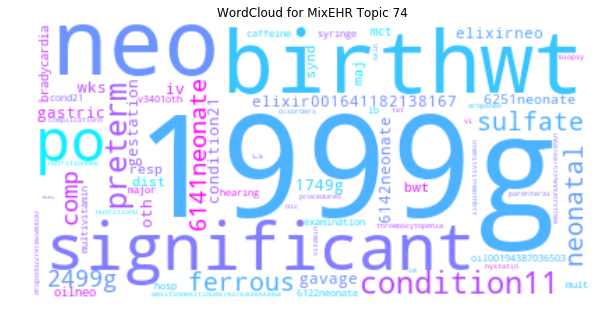

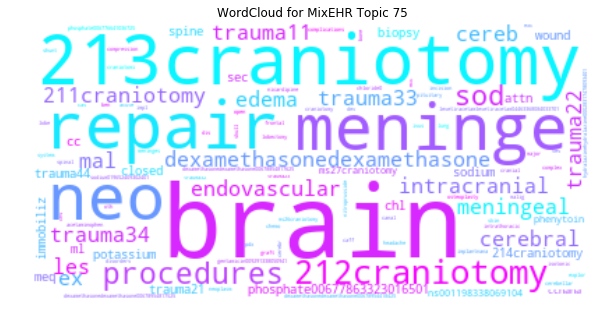

In [30]:
pheNames = phi_with_freqs_pheNames['pheName'].values.tolist()
pheNames = [pheName.lstrip(digits) for pheName in pheNames]
pheNames = [pheName.replace("_", "") for pheName in pheNames]


for cluster_number in range(1, 76):
    topic_distribution_column = phi_with_freqs_pheNames[str(cluster_number)]

    wc = WordCloud(stopwords=STOPWORDS, background_color="white", colormap="cool")

    topic_word_count = Counter()
    for i, pheName in enumerate(pheNames):
        word_counts = wc.process_text(pheName)
        word_freq_in_topic = int(topic_distribution_column.iloc[i])
        word_counts.update([(word.lower(), word_freq_in_topic) 
                            for word in word_counts.keys()]
                          )
        topic_word_count.update(word_counts)

    cloud = wc.generate_from_frequencies(topic_word_count)

    plt.figure(figsize=(10,10))
    plt.title("WordCloud for MixEHR Topic {}".format(cluster_number))
    plt.imshow(cloud, interpolation='bilinear')
    plt.axis('off')

    cloud_filename = os.path.join(wordcloud_path, "topic_{}_wordcloud_mixehr_removed_medical_stopwords.png".format(cluster_number))
    plt.savefig(cloud_filename)
    plt.show()